# Imports

In [1]:
import pyarrow as pa
import pyarrow.parquet as pq

import pandas as pd

import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
from ipywidgets import interact, fixed
import numpy as np

from scipy.stats import pearsonr, spearmanr

import geopandas as gpd #heatmap
import plotly.graph_objects as go
import plotly.io as pio

import json
from functools import partial

from matplotlib.colors import TwoSlopeNorm

# Data loading

### BTC data

In [2]:
btc_price_data = pd.read_csv("data/BTC_ALL_graph_coinmarketcap.csv",sep=";")

#split off time of day
btc_price_data["timestamp"] = btc_price_data["timestamp"].apply(lambda x: str(x).split("T")[0]) 
btc_price_data = btc_price_data[["high", "timestamp"]]
btc_price_data.rename(columns={"timestamp": "date"}, inplace=True)


btc_price_data["year"] = btc_price_data["date"].apply(lambda x: int(str(x).split("-")[0]))

btc_price_data = btc_price_data[btc_price_data['year'] >= 2011]

display(btc_price_data.tail())

,high,date,year
726,26550.072937,2023-05-04,2023
727,25148.010374,2023-05-11,2023
728,25338.472061,2023-05-17,2023
729,25279.405768,2023-05-24,2023
730,26131.181703,2023-05-30,2023


### Actors data

In [3]:
actors = pq.read_table("data/actors.parquet")
actors_df = actors.to_pandas()
actors_df = actors_df.dropna(subset="jurisdictions")
actors_df.head()

,id,uri,label,jurisdictions,categories
0,bilaxy,bilaxy.com,Bilaxy,HK,exchange
1,banxa,banxa.com,Banxa,"AU, NL, US",exchange
2,aax,www.aax.com,Aax,SC,exchange
3,altcointrader,www.altcointrader.co.za,AltcoinTrader,ZA,exchange
4,azbit,azbit.com,Azbit,MH,exchange


### Flow data

In [4]:
flows = pq.read_table("data/flows.parquet")
flows_df = flows.to_pandas()

flows_df.head()

,src_id,dst_id,value_asset,value_USD,date
0,1coin,1coin,36870000,243.755870,2014-03-03
1,1coin,1coin,380120000,2378.899210,2014-03-10
2,1coin,1coin,429150403,2738.687542,2014-03-13
3,1coin,1coin,333900098,2092.574397,2014-03-14
4,1coin,1coin,779334803,4938.373652,2014-03-15


### Country Codes

In [5]:
# Load country codes (source: https://github.com/lukes/ISO-3166-Countries-with-Regional-Codes)
country_codes = pd.read_csv('data/country_codes.csv')

display(country_codes.head())

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150.0,154.0,NaN
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9.0,61.0,NaN


### GDP Data

In [6]:
# Load GDP data (Source: https://data.worldbank.org/indicator/NY.GDP.MKTP.CD)
gdp = pd.read_csv('data/gdp.csv', skiprows=3)
gdp_meta = pd.read_csv('data/gdp_meta.csv')

display(gdp.head())
display(gdp_meta.head())

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,Unnamed: 67
0,Aruba,ABW,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,2.791061e+09,2.963128e+09,2.983799e+09,3.092179e+09,3.202235e+09,3.368970e+09,2.610039e+09,3.126019e+09,NaN,NaN
1,Africa Eastern and Southern,AFE,GDP (current US$),NY.GDP.MKTP.CD,2.129152e+10,2.180944e+10,2.370806e+10,2.821128e+10,2.611994e+10,2.968348e+10,...,1.003403e+12,9.231439e+11,8.898593e+11,1.030482e+12,1.016697e+12,1.009052e+12,9.341791e+11,1.089454e+12,NaN,NaN
2,Afghanistan,AFG,GDP (current US$),NY.GDP.MKTP.CD,5.377778e+08,5.488889e+08,5.466667e+08,7.511112e+08,8.000000e+08,1.006667e+09,...,2.055058e+10,1.999816e+10,1.801956e+10,1.889635e+10,1.841885e+10,1.890449e+10,2.014344e+10,1.478686e+10,NaN,NaN
3,Africa Western and Central,AFW,GDP (current US$),NY.GDP.MKTP.CD,1.040414e+10,1.112789e+10,1.194319e+10,1.267633e+10,1.383837e+10,1.486223e+10,...,8.924979e+11,7.669580e+11,6.905454e+11,6.837480e+11,7.663597e+11,7.947191e+11,7.847997e+11,8.401873e+11,NaN,NaN
4,Angola,AGO,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,1.372444e+11,8.721930e+10,4.984049e+10,6.897277e+10,7.779294e+10,6.930911e+10,5.361907e+10,6.740429e+10,NaN,NaN


,Country Code,Region,IncomeGroup,SpecialNotes,TableName,Unnamed: 5
0,ABW,Latin America & Caribbean,High income,NaN,Aruba,NaN
1,AFE,NaN,NaN,"26 countries, stretching from the Red Sea in t...",Africa Eastern and Southern,NaN
2,AFG,South Asia,Low income,The reporting period for national accounts dat...,Afghanistan,NaN
3,AFW,NaN,NaN,"22 countries, stretching from the westernmost ...",Africa Western and Central,NaN
4,AGO,Sub-Saharan Africa,Lower middle income,The World Bank systematically assesses the app...,Angola,NaN


### Overall BTC Trading Volume

In [7]:
trading_volume = pd.read_csv('data/bitcoin_trading_volume.csv')
trading_volume.Time = pd.to_datetime(trading_volume.Time)
trading_volume['year'] = trading_volume.Time.dt.year

display(trading_volume)

,Time,price,volume,year
0,2010-07-01 00:00:00+00:00,0.064460,1.966753e+03,2010
1,2010-08-01 00:00:00+00:00,0.064572,1.428969e+04,2010
2,2010-09-01 00:00:00+00:00,0.061903,1.344608e+04,2010
3,2010-10-01 00:00:00+00:00,0.108899,1.173847e+05,2010
4,2010-11-01 00:00:00+00:00,0.258841,2.237274e+05,2010
...,...,...,...,...
150,2023-01-01 00:00:00+00:00,20415.513027,2.299786e+10,2023
151,2023-02-01 00:00:00+00:00,23743.338494,1.333384e+10,2023
152,2023-03-01 00:00:00+00:00,25618.094071,2.468627e+10,2023
153,2023-04-01 00:00:00+00:00,29181.453834,1.686690e+10,2023


### Juri names Long

In [8]:
with open('data/country_names_long.json', 'r') as file:
    juri_names_long = json.load(file)

### Population data

In [9]:
# Load Population data (Source: https://data.worldbank.org/indicator/SP.POP.TOTL)
population = pd.read_csv('data/population.csv', skiprows=3)

display(population.head())

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,Unnamed: 67
0,Aruba,ABW,"Population, total",SP.POP.TOTL,54608.0,55811.0,56682.0,57475.0,58178.0,58782.0,...,103594.0,104257.0,104874.0,105439.0,105962.0,106442.0,106585.0,106537.0,NaN,NaN
1,Africa Eastern and Southern,AFE,"Population, total",SP.POP.TOTL,130692579.0,134169237.0,137835590.0,141630546.0,145605995.0,149742351.0,...,583650827.0,600008150.0,616377331.0,632746296.0,649756874.0,667242712.0,685112705.0,702976832.0,NaN,NaN
2,Afghanistan,AFG,"Population, total",SP.POP.TOTL,8622466.0,8790140.0,8969047.0,9157465.0,9355514.0,9565147.0,...,32716210.0,33753499.0,34636207.0,35643418.0,36686784.0,37769499.0,38972230.0,40099462.0,NaN,NaN
3,Africa Western and Central,AFW,"Population, total",SP.POP.TOTL,97256290.0,99314028.0,101445032.0,103667517.0,105959979.0,108336203.0,...,397855507.0,408690375.0,419778384.0,431138704.0,442646825.0,454306063.0,466189102.0,478185907.0,NaN,NaN
4,Angola,AGO,"Population, total",SP.POP.TOTL,5357195.0,5441333.0,5521400.0,5599827.0,5673199.0,5736582.0,...,27128337.0,28127721.0,29154746.0,30208628.0,31273533.0,32353588.0,33428486.0,34503774.0,NaN,NaN


### Tax Haven data

In [10]:
# Load tax haven data (Source: https://www.taxjustice.net)
cthi_2021 = pd.read_csv('data/cthi_2021.csv', sep=';')[['Country', 'Haven Score']]
cthi_2019 = pd.read_csv('data/cthi_2019.csv', sep=';')[['Country', 'Haven Score']]
cthi_2019['Haven Score'] = cthi_2019['Haven Score'].str.replace(',', '.').astype('float')
cthi_2021['Haven Score'] = cthi_2021['Haven Score'].str.replace(',', '.').astype('float')

# If both datapoints are available for a country we average over the 2021 and 2019 score

cthi = pd.merge(cthi_2019, cthi_2021, on='Country', how='outer')
print(f'Shape {cthi.shape[0]}')
cthi['Haven Score'] = cthi[['Haven Score_x', 'Haven Score_y']].mean(axis=1, skipna=True).fillna(0)
cthi.drop(columns=['Haven Score_x', 'Haven Score_y'], inplace=True)

display(cthi.head())

Shape 77


,Country,Haven Score
0,Andorra,65.175
1,Anguilla,100.000
2,Aruba,67.245
3,Austria,53.645
4,Bahamas,100.000


### Corruption data

In [11]:
# Load Corruption Perception data (Source: https://www.transparency.org via https://www.kaggle.com/datasets/jeegarmaru/corruption-perceptions-index-for-10-years?select=merged_cpi_data.csv)
cpi = pd.read_csv('data/cpi_data.csv')

display(cpi.head())

,Year,Country,CPI Score,Rank,Number of Sources,Minimum score,Maximum score,Standard Error,90% Confidence Interval (Higher bound),90% Confidence Interval (Lower bound),...,WJP,ISO3,Region,WB Code,OECD,G20,BRICS,EU,Arab states,IFS Code
0,2010,Denmark,93.0,1,6,89.0,95.0,2.0,94.0,91.0,...,NaN,DNK,WE/EU,DNK,y,NaN,NaN,y,NaN,128.0
1,2010,New Zealand,93.0,1,6,89.0,95.0,2.0,95.0,92.0,...,NaN,NZL,AP,NZL,y,NaN,NaN,NaN,NaN,196.0
2,2010,Singapore,93.0,1,9,89.0,95.0,2.0,94.0,92.0,...,NaN,SGP,AP,SGP,NaN,NaN,NaN,NaN,NaN,576.0
3,2010,Finland,92.0,4,6,89.0,95.0,2.0,93.0,91.0,...,NaN,FIN,WE/EU,FIN,y,NaN,NaN,y,NaN,172.0
4,2010,Sweden,92.0,4,6,89.0,95.0,2.0,94.0,91.0,...,NaN,SWE,WE/EU,SWE,y,NaN,NaN,y,NaN,144.0


# Data exploration

### General information about the flow dataset

In [12]:
print(f'Number of rows in the flow dataset {flows_df.shape[0]}')
print(f'First flow: {flows_df.date.min()}, last flow: {flows_df.date.max()}')

common_values = flows_df.src_id.value_counts().index.union(flows_df.dst_id.value_counts().index)
print(f"Entity Count: {len(common_values)}")

filtered_flows_df = flows_df

Number of rows in the flow dataset 1939587
First flow: 2011-05-13, last flow: 2023-04-12
Entity Count: 290


### Distribution of category tags

Category distribution


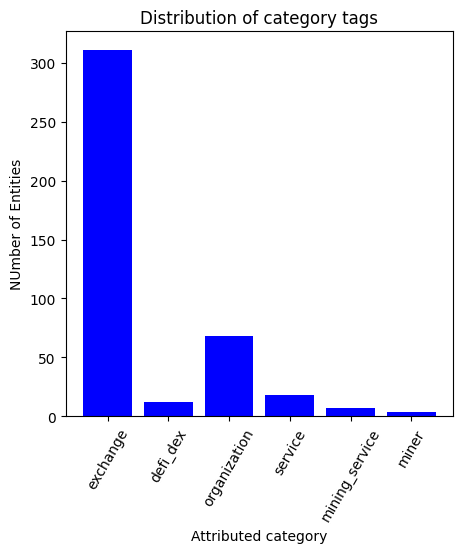

In [13]:
print('Category distribution')
counts = actors_df.categories.value_counts()

values = actors_df.categories.unique()
actual_values = {}
for value in values:
    for v in value.split(", "):
        if not v in actual_values:
            actual_values[v] =0
        actual_values[v] = actual_values[v]+counts[value]

plt.figure(figsize=(5, 5)) 
plt.bar(actual_values.keys(), actual_values.values(),color="blue")
plt.xlabel('Attributed category')
plt.ylabel('NUmber of Entities')
plt.title('Distribution of category tags')
plt.tick_params(axis='x', rotation=60)
plt.savefig('figs/category_tags.png')
plt.show()

### Distribution of the jurisdictions

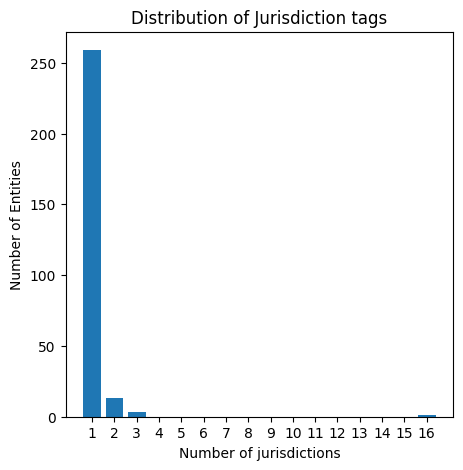

jurisdictions
1     259
2      13
3       3
16      1
Name: count, dtype: int64

In [14]:
# Compute the comma count for each value in the "jurisdictions" column
all_actors_in_flow_data = flows_df.src_id.value_counts().index.union(flows_df.dst_id.value_counts().index)
filtered_actors = actors_df[actors_df.id.str.lower().isin(all_actors_in_flow_data)]
comma_count_stats = filtered_actors['jurisdictions'].apply(lambda x: str(x).count(',')+1).value_counts().sort_index()

plt.figure(figsize=(5, 5)) 
plt.bar(comma_count_stats.index, comma_count_stats.values)
plt.xlabel('Number of jurisdictions')
plt.ylabel('Number of Entities')
plt.xticks(range(1, max(comma_count_stats.index) + 1), range(1, max(comma_count_stats.index) + 1))
plt.title('Distribution of Jurisdiction tags')
plt.savefig('figs/juri_tags.png')
plt.show()

comma_count_stats

### Distribution of the entities

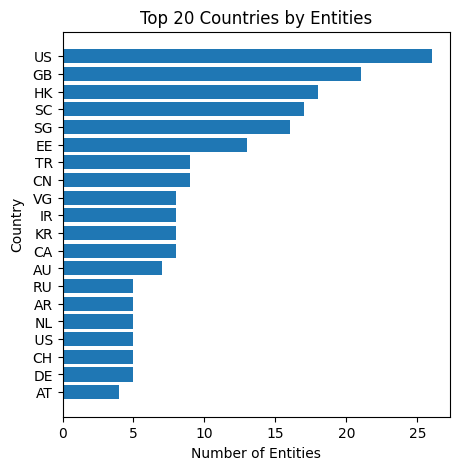

In [15]:
# Check distribution of jurisdictions
actors_jurisdictions = filtered_actors.assign(jurisdictions=filtered_actors.jurisdictions.str.split(','))
actors_jurisdictions = actors_jurisdictions.explode('jurisdictions')
jurisdiction_distribution = actors_jurisdictions.jurisdictions.value_counts().head(20)

plt.figure(figsize=(5, 5)) 
plt.barh(jurisdiction_distribution.index[::-1], jurisdiction_distribution.values[::-1])
plt.xlabel('Number of Entities')
plt.ylabel('Country')
#plt.xticks(range(1, 25), range(1, 25))
plt.title('Top 20 Countries by Entities')
plt.savefig('figs/juri_entities.png')
plt.show()

### Merge flow and actor data

In [16]:
print(f'Flows before merging actor data {flows_df.shape[0]}')
merged_df = pd.merge(filtered_flows_df, actors_df.add_prefix('src_'), on='src_id', how='inner')
merged_df = pd.merge(merged_df, actors_df.add_prefix('dst_'), on='dst_id', how='inner')
print(f'Flows after merging actor data {merged_df.shape[0]}')
display(merged_df.head())

Flows before merging actor data 1939587
Flows after merging actor data 1864698


,src_id,dst_id,value_asset,value_USD,date,src_uri,src_label,src_jurisdictions,src_categories,dst_uri,dst_label,dst_jurisdictions,dst_categories
0,1coin,1coin,36870000,243.755870,2014-03-03,1coin.io,1Coin,"CA, US",exchange,1coin.io,1Coin,"CA, US",exchange
1,1coin,1coin,380120000,2378.899210,2014-03-10,1coin.io,1Coin,"CA, US",exchange,1coin.io,1Coin,"CA, US",exchange
2,1coin,1coin,429150403,2738.687542,2014-03-13,1coin.io,1Coin,"CA, US",exchange,1coin.io,1Coin,"CA, US",exchange
3,1coin,1coin,333900098,2092.574397,2014-03-14,1coin.io,1Coin,"CA, US",exchange,1coin.io,1Coin,"CA, US",exchange
4,1coin,1coin,779334803,4938.373652,2014-03-15,1coin.io,1Coin,"CA, US",exchange,1coin.io,1Coin,"CA, US",exchange


### Merge in btc course data

In [17]:
# merge in btc course data
print(f'Flows before merging btc_price_data data {merged_df.shape[0]}')
merged_df = pd.merge(merged_df, btc_price_data, on="date", how='left')
print(f'Flows after merging btc_price_data data {merged_df.shape[0]}')

Flows before merging btc_price_data data 1864698
Flows after merging btc_price_data data 1864698


### Fix Date

In [18]:
# Types
merged_df['date'] = pd.to_datetime(merged_df['date'])

### Portion of binance traffic

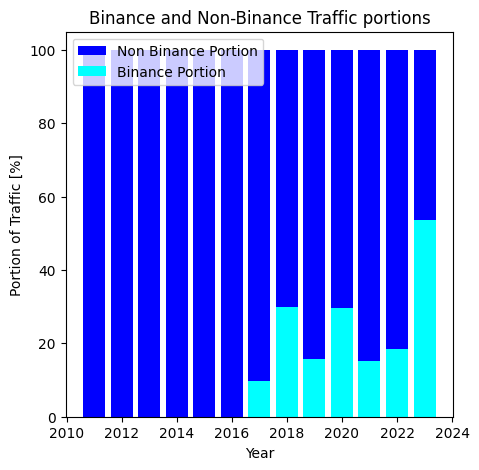

In [19]:
# calc overall traffic per year
yearly = merged_df.groupby(["year"])["value_USD"].sum().reset_index()
yearly.rename(columns={"value_USD":"value_usd_with"},inplace=True)

yearly_without_binance = merged_df[merged_df["src_label"].str.contains("inance") == False]
yearly_without_binance = yearly_without_binance[yearly_without_binance["dst_label"].str.contains("inance") == False]

yearly["value_usd_without"] = yearly_without_binance.groupby(["year"])["value_USD"].sum().reset_index()["value_USD"]
yearly["binance portion"] = (1-(yearly["value_usd_without"]/yearly["value_usd_with"]))*100

yearly.set_index('year',inplace=True)

# Create a figure and axes
plt.figure(figsize=(5,5))

# Plot the data
plt.bar(yearly.index,100,color='blue',label="Non Binance Portion")
plt.bar(yearly.index, yearly['binance portion'], color='cyan',label="Binance Portion")

# Set labels and title
plt.xlabel('Year')
plt.ylabel('Portion of Traffic [%]')
plt.title('Binance and Non-Binance Traffic portions')

plt.legend(loc='upper left',ncol=1)

# Display the plot
plt.show()

### Portion of overall trading volume captured

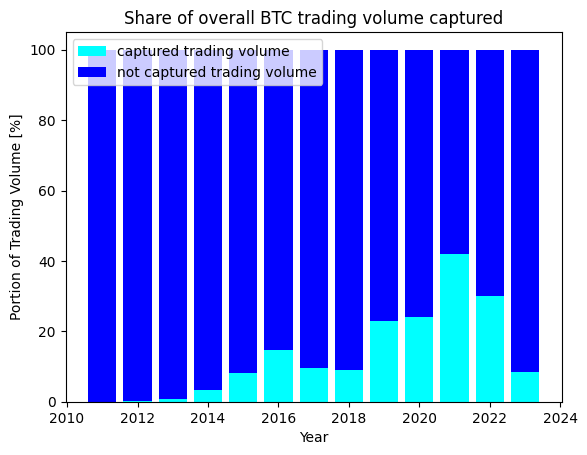

In [20]:
# Compare value per year with overall BTC trading volume
yearly_flow = yearly.copy()
volume_year = trading_volume.groupby(["year"])['volume'].sum().reset_index()
merged_volume = pd.merge(yearly_flow, volume_year, on='year', how='inner').reset_index()

#display(merged_volume)

fig, ax = plt.subplots()
bottom = np.zeros(3)
width=0.8

relative_value_flow = merged_volume.value_usd_with / merged_volume.volume
ax.bar(merged_volume.year, relative_value_flow * 100, width, label='captured trading volume', bottom=0, color='cyan')
ax.bar(merged_volume.year, 100 - relative_value_flow * 100, width, label='not captured trading volume', bottom=relative_value_flow * 100, color='blue')

ax.set_title("Share of overall BTC trading volume captured")
plt.ylabel('Portion of Trading Volume [%]')
plt.xlabel('Year')
plt.legend(loc='upper left',ncol=1)

plt.savefig('figs/trading_portion.png')
plt.show()

# Apply heuristic to split traffic for actors with multiple jurisdictions

## Split by juritags

In [21]:
# Transform jurisdiction string into list element
expanded_df = merged_df.copy()
expanded_df.src_jurisdictions = expanded_df.src_jurisdictions.fillna("")
expanded_df.dst_jurisdictions = expanded_df.dst_jurisdictions.fillna("")
expanded_df = expanded_df.assign(src_jurisdictions=expanded_df.src_jurisdictions.str.split(','))
expanded_df = expanded_df.assign(dst_jurisdictions=expanded_df.dst_jurisdictions.str.split(','))

# Split up amounts by number of src and dst countries
expanded_df['value_asset'] = expanded_df.apply(lambda row: row['value_asset'] / max(len(row.src_jurisdictions) * len(row.dst_jurisdictions), 1) , axis=1)
expanded_df['value_USD'] = expanded_df.apply(lambda row: row['value_USD'] / max(len(row.src_jurisdictions) * len(row.dst_jurisdictions), 1), axis=1)

# Create separate columns for each jurisdiction (if we want to split the amounts we have to split amount before)
expanded_df = expanded_df.explode('dst_jurisdictions')
expanded_df = expanded_df.explode('src_jurisdictions')


# Strip whitespace
expanded_df.dst_jurisdictions = expanded_df.dst_jurisdictions.str.strip()
expanded_df.src_jurisdictions = expanded_df.src_jurisdictions.str.strip()

expanded_df_with_inland = expanded_df.copy()
# Remove flows which aren't x-border
expanded_df_without_inland = expanded_df[expanded_df['dst_jurisdictions'] != expanded_df['src_jurisdictions']]

expanded_df = expanded_df[expanded_df['dst_jurisdictions'] != expanded_df['src_jurisdictions']]

## Split into src and dst dfs

In [22]:
# divide by btc value
# Do we really need this? Isn't value_asset already the number of tokens?
expanded_df["value_BTC"] = expanded_df["value_USD"] / expanded_df["high"]

# Group by year and juristicion
# those are the aggregated recievers
dst_amounts = expanded_df.groupby(['year', 'dst_jurisdictions'])[['value_USD', 'value_asset',"src_label","dst_label"]].sum().reset_index()
dst_amounts = dst_amounts.rename(columns={"dst_jurisdictions":"jurisdictions"})
dst_amounts["jurisdictions_long"] = dst_amounts["jurisdictions"].apply(lambda x: juri_names_long[x] if x in juri_names_long else x)

# this are the aggregated "spenders"
src_amounts = expanded_df.groupby(['year', 'src_jurisdictions'])[['value_USD', 'value_asset',"src_label","dst_label"]].sum().reset_index()
src_amounts = src_amounts.rename(columns={"src_jurisdictions":"jurisdictions"})
src_amounts["jurisdictions_long"] = src_amounts["jurisdictions"].apply(lambda x: juri_names_long[x] if x in juri_names_long else x)

# Further Exploration (of the newly constructed data set)

## Portions of inland and crossborder traffic

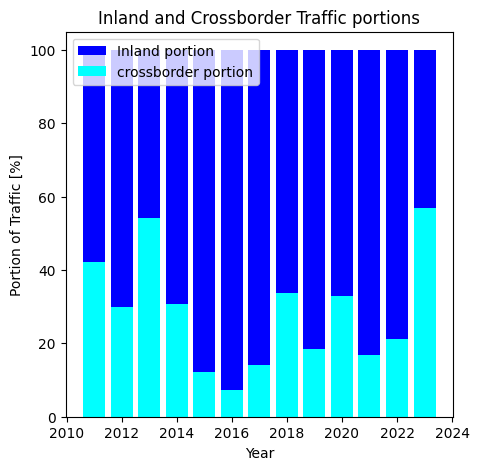

In [23]:
# calc overall traffic per year
yearly = expanded_df_with_inland.groupby(["year"])["value_USD"].sum().reset_index()
yearly.rename(columns={"value_USD":"value_usd_with"},inplace=True)

yearly_without_inland = expanded_df_with_inland[expanded_df_with_inland['dst_jurisdictions'] != expanded_df_with_inland['src_jurisdictions']]
yearly["value_usd_without"] = yearly_without_inland.groupby(["year"])["value_USD"].sum().reset_index()["value_USD"]
yearly["inland portion"] = (1-(yearly["value_usd_without"]/yearly["value_usd_with"]))*100
yearly["crossborder portion"] = (yearly["value_usd_without"]/yearly["value_usd_with"])*100

yearly.set_index('year',inplace=True)

# Create a figure and axes
plt.figure(figsize=(5,5))

# Plot the data
#ax.plot(yearly.index, yearly['inland portion'], color='blue',marker="x",linestyle="dashdot",label="BTC FLOW")
plt.bar(yearly.index,100,color="blue",label="Inland portion")
plt.bar(yearly.index,yearly["crossborder portion"],color="cyan",label="crossborder portion")

# Set labels and title
plt.xlabel('Year')
plt.ylabel('Portion of Traffic [%]')
plt.title('Inland and Crossborder Traffic portions')

plt.legend(loc='upper left',ncol=1)
plt.savefig('figs/xbordertraffic.png')

# Display the plot
plt.show()

In [24]:
# Number of flows after merging and filtering for different locations
print(f'Number of rows in the flow dataset {merged_df.shape[0]}')

Number of rows in the flow dataset 1864698


## How does the general trend look like?

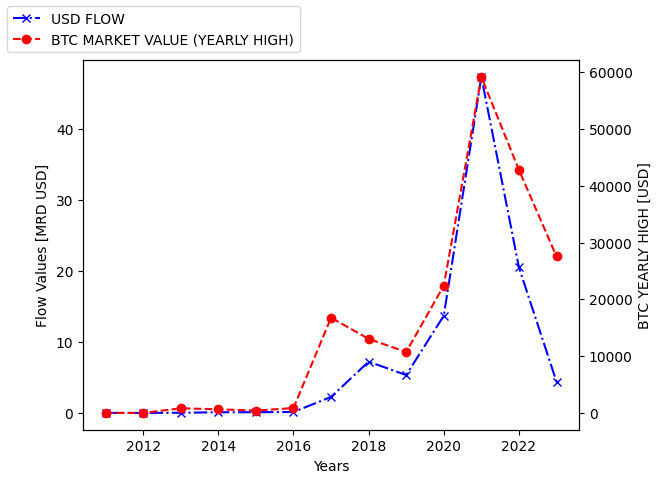

In [25]:
def test_plot(flow_data, btc_data):
    _flow_data = flow_data.groupby('year')["value_USD"].sum()/(10**9)
    _btc_data = btc_data.groupby('year')["high"].max()

    fig, ax1 = plt.subplots()

    # Plotting the bar plot
    ax1.plot(_flow_data.index, _flow_data.values, color='blue',marker="x",linestyle="dashdot",label="USD FLOW")
    ax1.set_ylabel('Flow Values [MRD USD]')
    ax2 = ax1.twinx()

    # Plotting the line plot
    ax2.plot(_flow_data.index, _btc_data.values, color='red', marker='o', linestyle="dashed",label="BTC MARKET VALUE (YEARLY HIGH)")
    ax2.set_ylabel('BTC YEARLY HIGH [USD]')
    ax1.set_xlabel('Years')
    fig.legend(loc='upper left',ncol=1)

    #plt.tight_layout()

test_plot(src_amounts, btc_price_data)
#test_plot(dst_amounts)

## Frequency of jurisidictions in the flow data

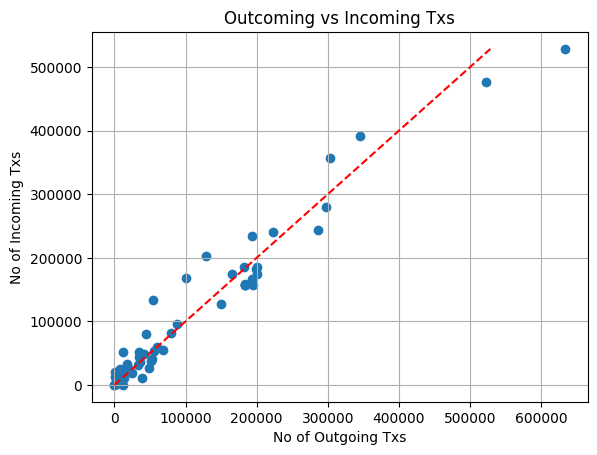

PearsonRResult(statistic=0.9735208109695995, pvalue=1.6265052742133593e-39)

In [26]:
src_juri_freq = expanded_df.src_jurisdictions.value_counts()
dst_juri_freq = expanded_df.dst_jurisdictions.value_counts()
merged_freq = pd.merge(src_juri_freq, dst_juri_freq, left_index=True, right_index=True, how='inner')

plt.scatter(x=merged_freq.count_x, y=merged_freq.count_y)
plt.xlabel('No of Outgoing Txs')
plt.ylabel('No of Incoming Txs')
plt.title('Outcoming vs Incoming Txs')
plt.grid(True)
line = np.linspace(min(merged_freq.count_x), max(merged_freq.count_y), 100)
plt.plot(line, line, color='r', linestyle='--')
plt.savefig('figs/distribution_in_out.png')
plt.show()

#display(merged_freq)
#display(merged_freq.sort_values(by='count_x', ascending=False))
#display(merged_freq.sort_values(by='count_y', ascending=False))
#display(src_juri_freq.head(10))
#display(dst_juri_freq.head(10))

corr = pearsonr(merged_freq.count_x, merged_freq.count_y)
display(corr)

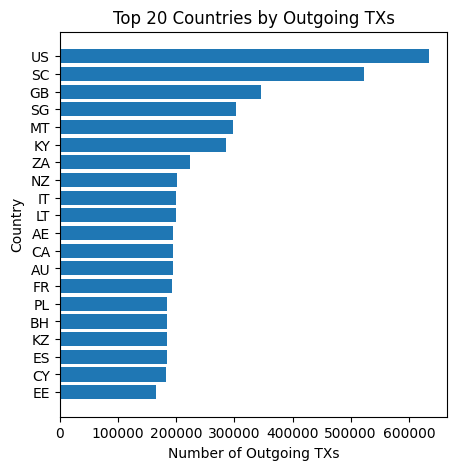

In [27]:
# Plot top 20 in terms of incoming tx
top20_src = src_juri_freq.head(20)
plt.figure(figsize=(5, 5)) 
plt.barh(top20_src.index[::-1], top20_src.values[::-1])
plt.xlabel('Number of Outgoing TXs')
plt.ylabel('Country')
#plt.xticks(range(1, 25), range(1, 25))
plt.title('Top 20 Countries by Outgoing TXs')
plt.savefig('figs/outgoing_top20.png')
plt.show()

# How strongly are jurisdictions “linked” to each other?

## Trading Pairs frequency

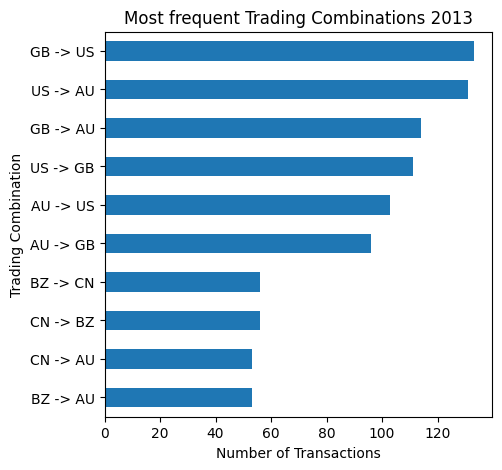

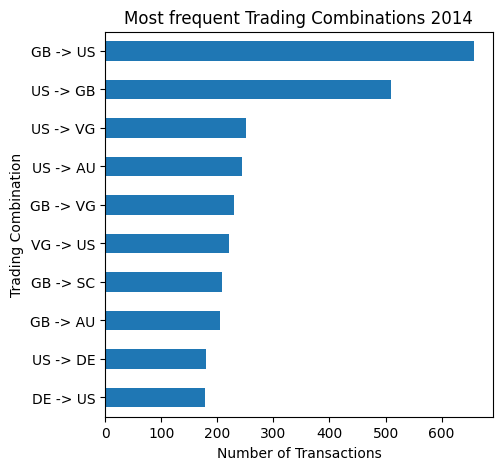

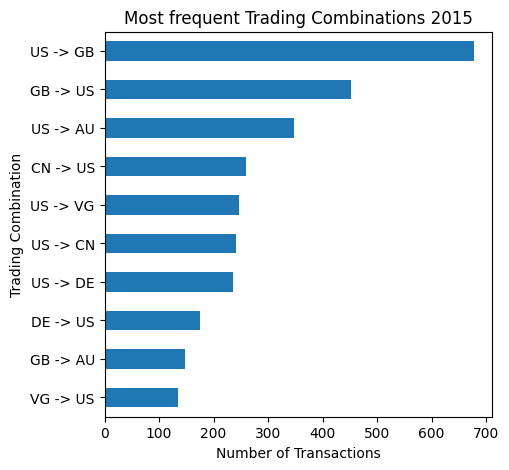

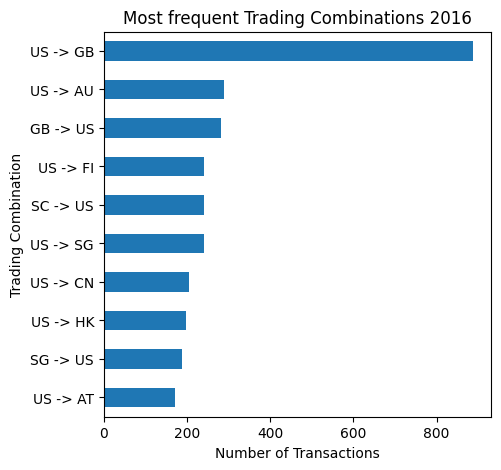

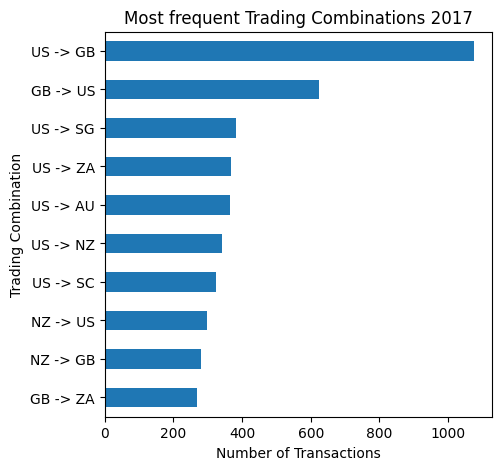

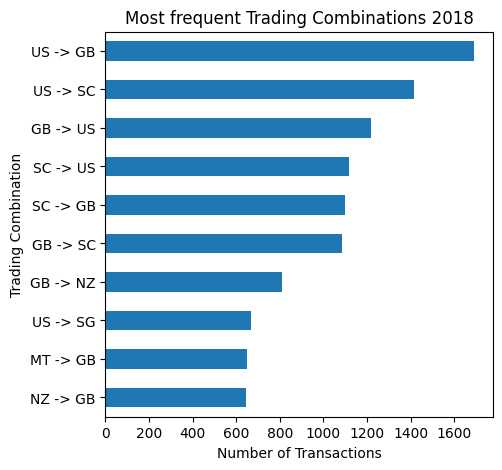

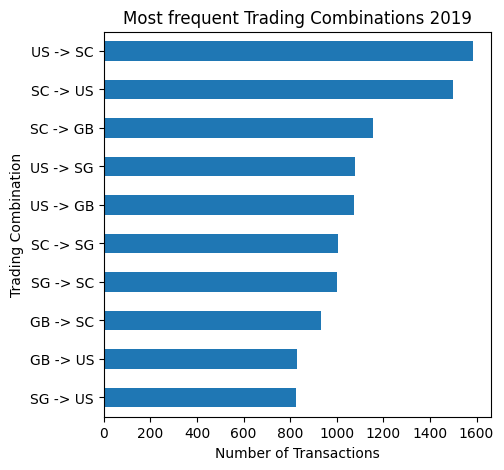

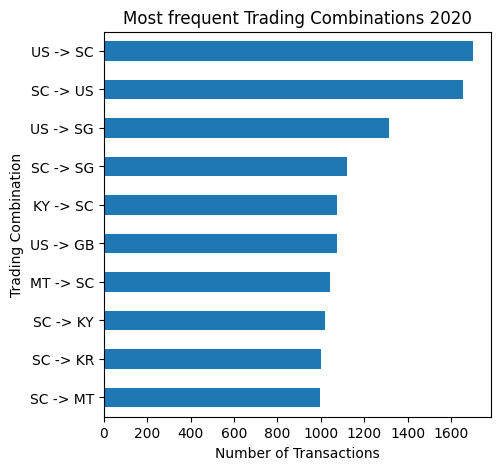

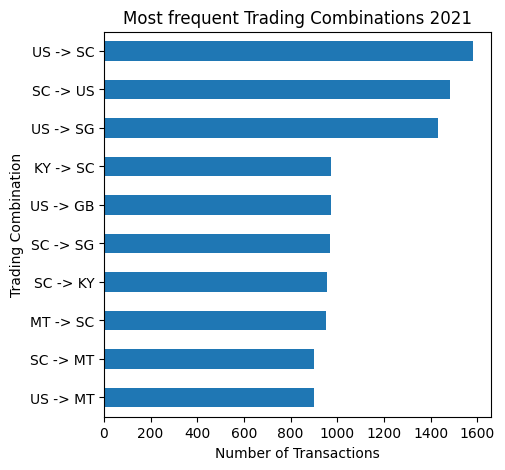

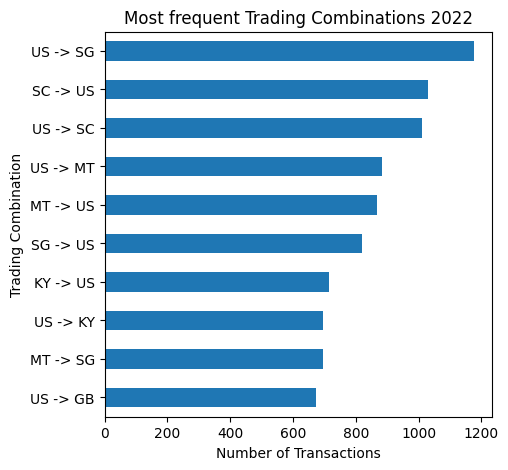

In [28]:
trading_pair_df = expanded_df.copy()
trading_pair_df['trading_pairs'] = trading_pair_df['src_jurisdictions'] + ' -> ' + trading_pair_df['dst_jurisdictions']

# Create a grid of subplots

for year in range(2013, 2023):
    trading_pair_df[trading_pair_df.year == year].trading_pairs.value_counts().head(10)[::-1].plot.barh(figsize=(5, 5))
    plt.xlabel('Number of Transactions')
    plt.ylabel('Trading Combination')
    plt.title(f'Most frequent Trading Combinations {year}')
    plt.savefig(f'figs/trading_combination_{year}.png', bbox_inches='tight')
    plt.show()


## Who trades whith whom? And how does it change over the years?

In [29]:
pairs = expanded_df.copy()

for year in range(2013, 2023):

    grouped_df = pairs[pairs.year == year].groupby(['src_jurisdictions', 'dst_jurisdictions'])['value_USD'].sum()
    src_countries = list(grouped_df.index.get_level_values(0).unique())
    dst_countries = list(grouped_df.index.get_level_values(1).unique())
    all_countries = list(set(src_countries + dst_countries))

    countries_index = {}
    for i, country in enumerate(all_countries):
        countries_index[country] = i

    sources = []
    target = []
    values = []
    text = []
    for element in grouped_df.index:
        src = element[0]
        dst = element[1]
        value = grouped_df[element]
    
        if src == 'US' and value > 10000:
            sources.append(countries_index[src])
            target.append(countries_index[dst] + len(countries_index))
            values.append(value)
            text.append(f'{value}')

    # Sankey Diagram
    fig = go.Figure(data=[go.Sankey(
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(color = "black", width = 0.5),
          label = all_countries + all_countries,
          color = "gray"
        ),
        link = dict(
          source = sources, # indices correspond to labels, eg A1, A2, A1, B1, ...
          target = target,
          value = values,
      ))])
    fig.update_layout(title_text=f'US Outgoing BTC Flow {year}', font_size=10)
    #pio.write_image(fig, f'figs/us_flow{year}.png')
    fig.show()

# Who are net receiver/source jurisdictions (and how did they change over time)? 

## Aggregated net flows by jurisdictions (BARS)

interactive(children=(IntSlider(value=2017, description='year', max=2022, min=2012), Output()), _dom_classes=(…

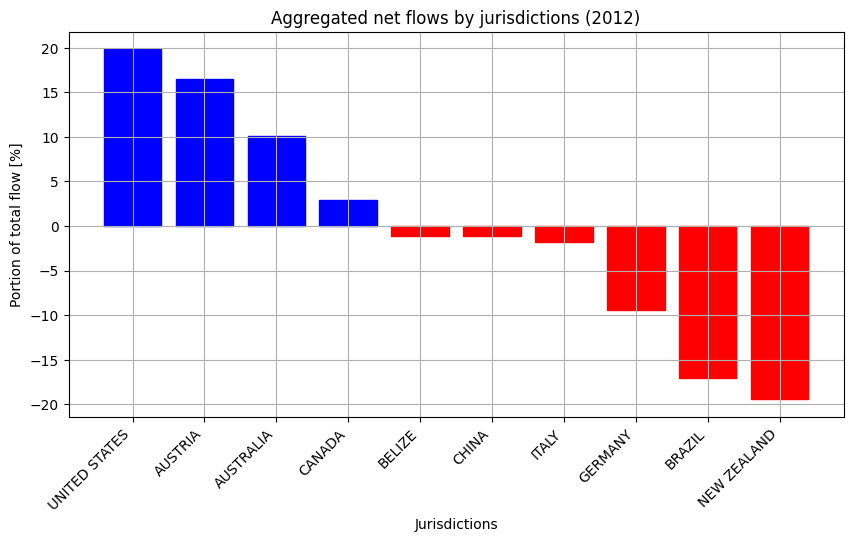

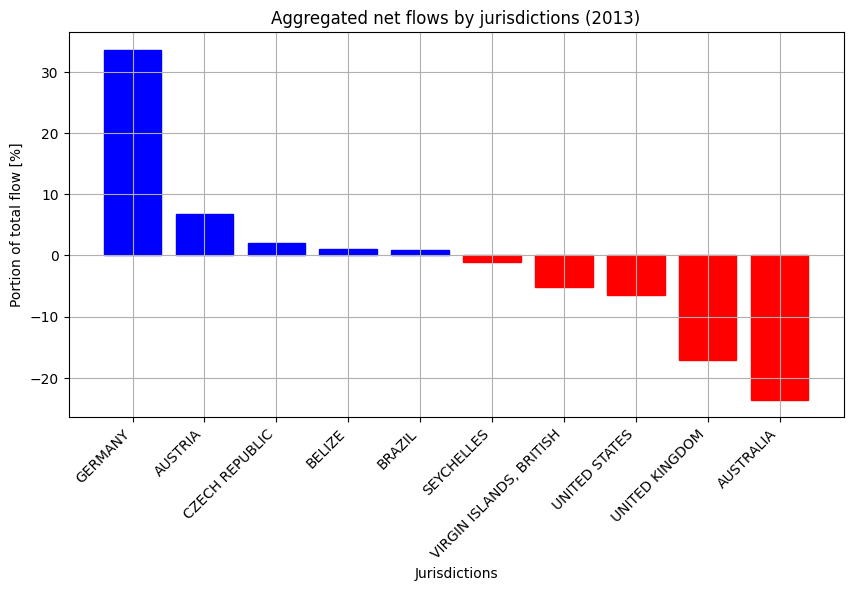

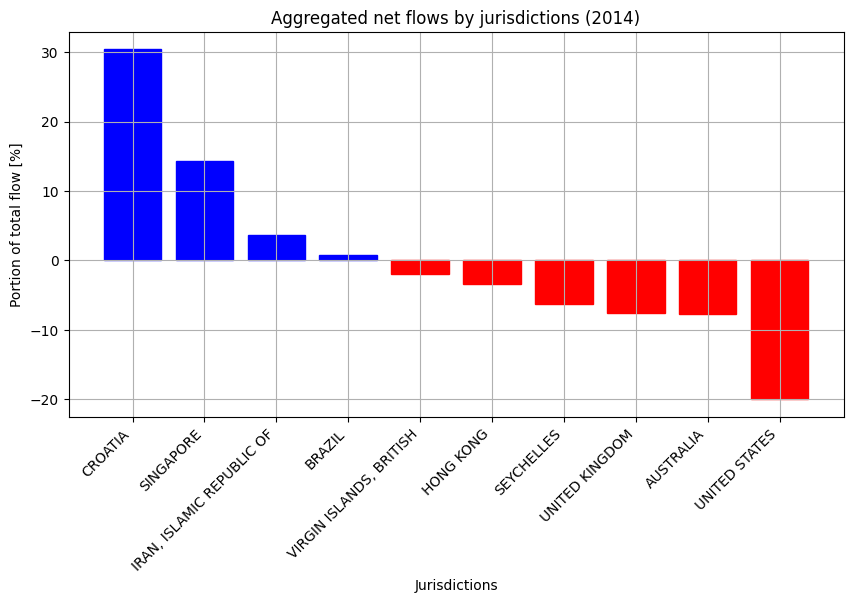

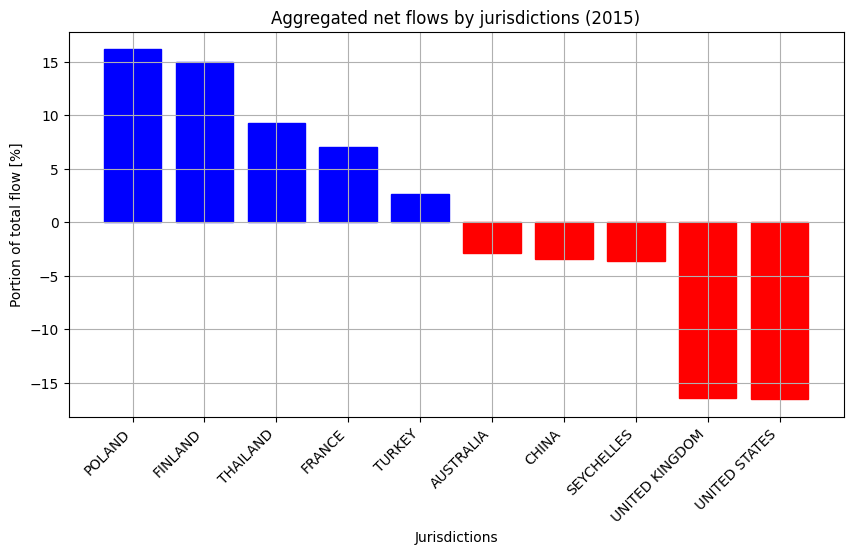

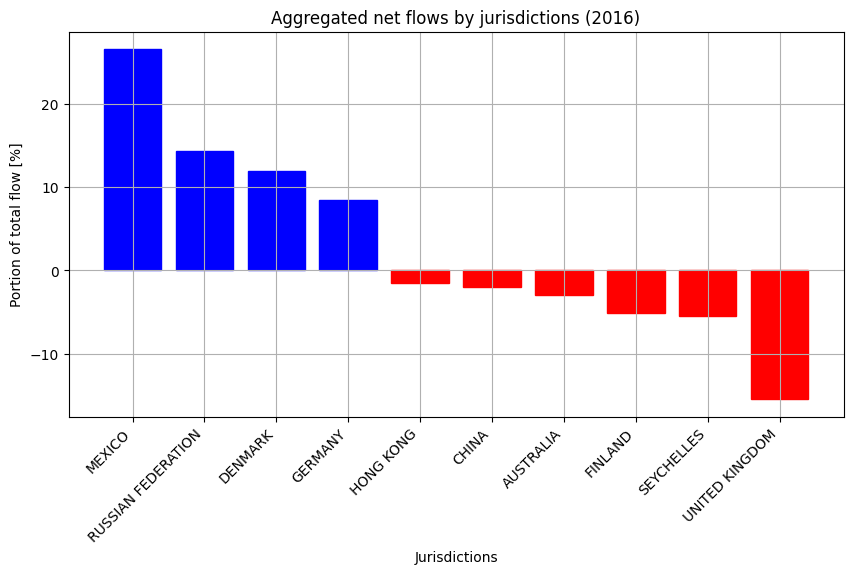

...

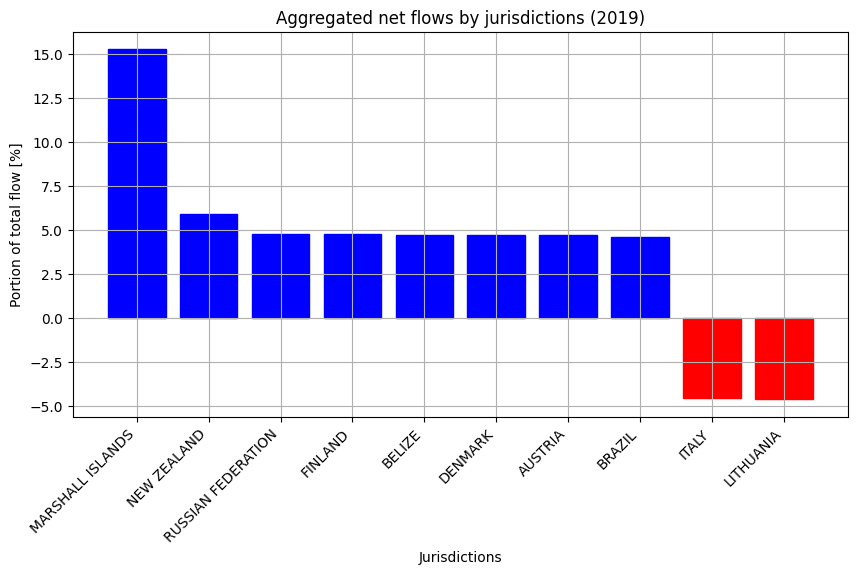

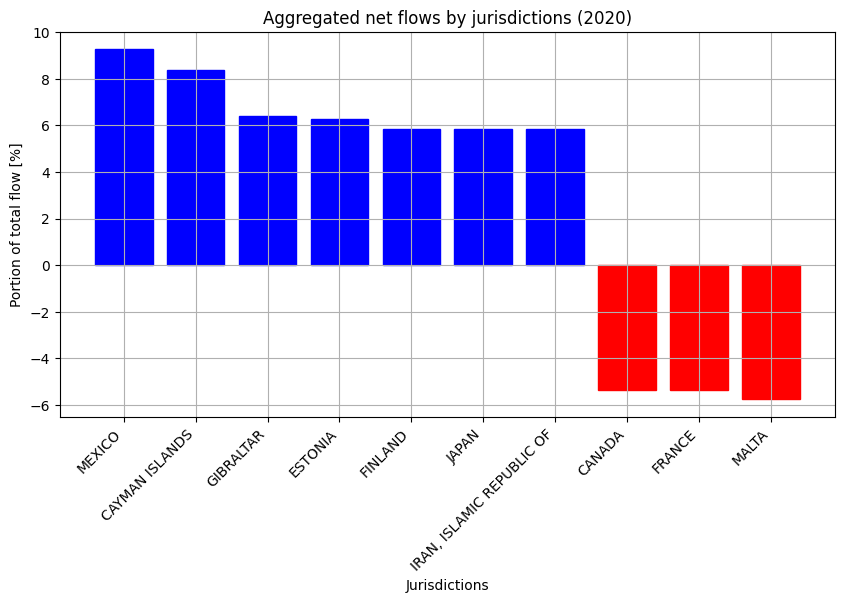

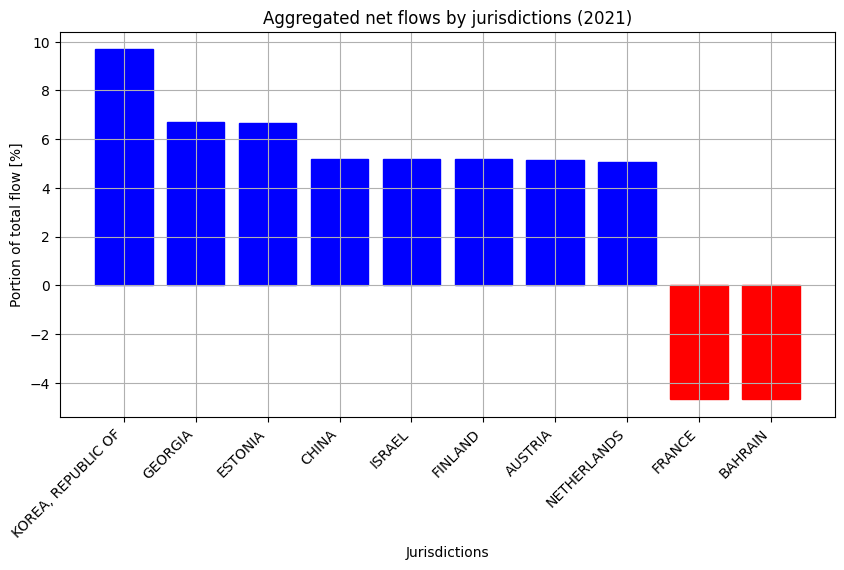

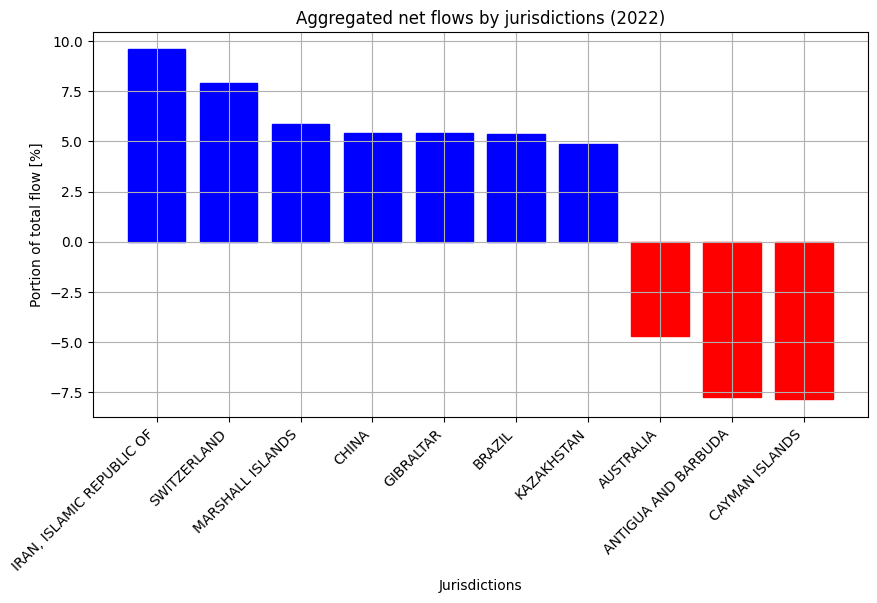

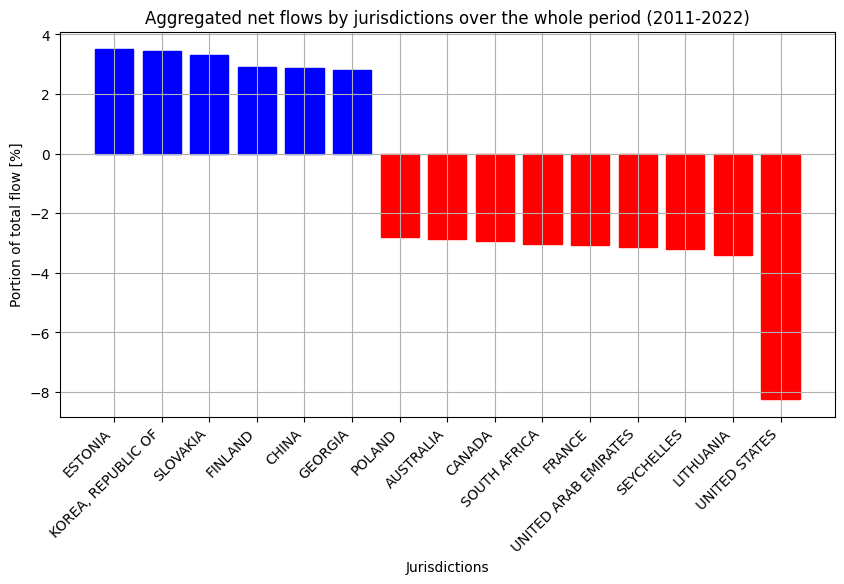

In [30]:
def plot_net_flows_by_year(src_amounts,dst_amounts,year,save,forall):
    if not forall:
        _src_amounts = src_amounts.copy()[src_amounts["year"]== year]
        _dst_amounts = dst_amounts.copy()[dst_amounts["year"]== year]
    else:
        _src_amounts = src_amounts.copy()
        _dst_amounts = dst_amounts.copy()

    res = _dst_amounts
    res["value_USD"] = _src_amounts['value_USD'].sub(_dst_amounts['value_USD'], axis=0)
    res = res.groupby(['jurisdictions_long'])['value_USD'].sum().reset_index()

    res = res.sort_values("jurisdictions_long",ascending=True)
    res["value_USD"] =  (res["value_USD"] / res["value_USD"].abs().sum())*100 #convert to %

    #filter out the top X
    if forall:
        cutoff = 15
    else:
        cutoff = 10
    top_cutoff = float(res["value_USD"].abs().nlargest(cutoff).nsmallest(1).iloc[0])#
    res = res[res["value_USD"].abs()>=top_cutoff]

    res = res.sort_values(by='value_USD',ascending=False)
    plt.figure(figsize=(10, 5))

    # Plot the bar chart
    bars = plt.bar(res['jurisdictions_long'], res['value_USD'])

    # Set labels and title
    plt.xlabel('Jurisdictions')
    plt.ylabel('Portion of total flow [%]')

    if forall:
        plt.title('Aggregated net flows by jurisdictions over the whole period (2011-2022)')
    else:
        plt.title('Aggregated net flows by jurisdictions ('+str(year)+')')

    # Rotate x-axis labels for better visibility
    plt.xticks(rotation=45,ha='right')
    plt.grid(True)

    # Color the bars based on a condition
    for bar, value in zip(bars, res['value_USD']):
        if value < 0:
            bar.set_color('red')
        else:
            bar.set_color('blue')

    # Display the plot
    if(save):
        if forall:
            plt.savefig("figs/aggregated",bbox_inches='tight')
        else:
            plt.savefig("figs/aggregated_"+str(year),bbox_inches='tight')
    else:  
        plt.show()

interact(plot_net_flows_by_year,src_amounts=fixed(src_amounts),dst_amounts=fixed(dst_amounts),year=(2012,2022,1),save=fixed(False),forall=fixed(False))

for year in range(2012, 2023):
    plot_net_flows_by_year(src_amounts=src_amounts,dst_amounts=dst_amounts,year=year,save=True,forall=False)

plot_net_flows_by_year(src_amounts=src_amounts,dst_amounts=dst_amounts,year=year,save=True,forall=True)

## Aggregated net flows by country (BARS)

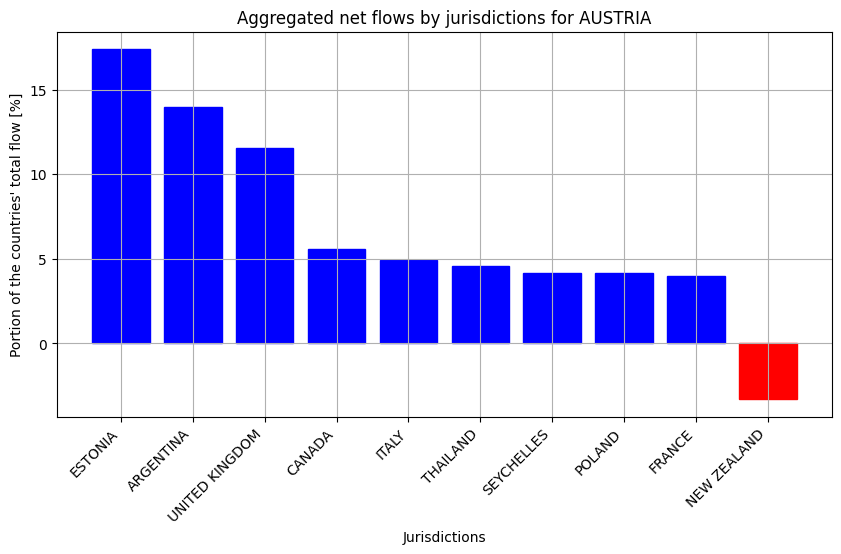

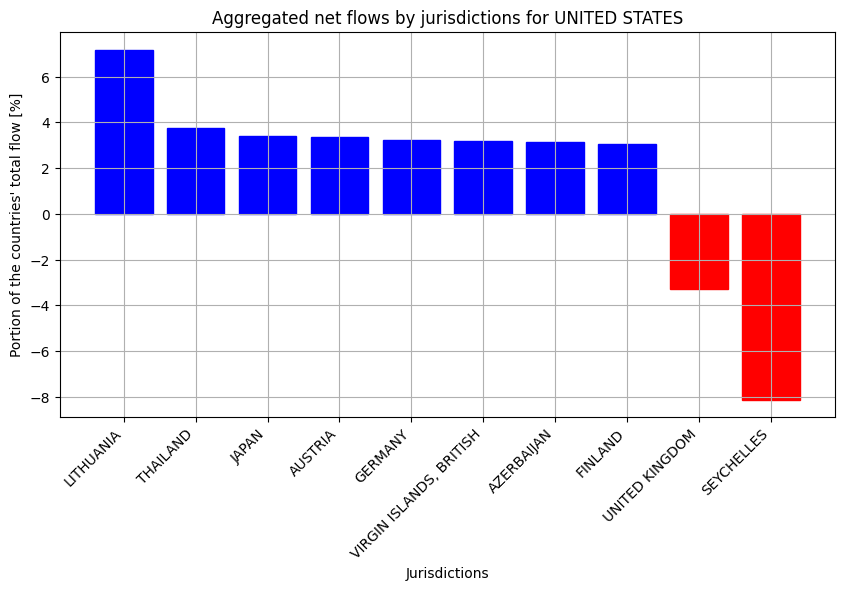

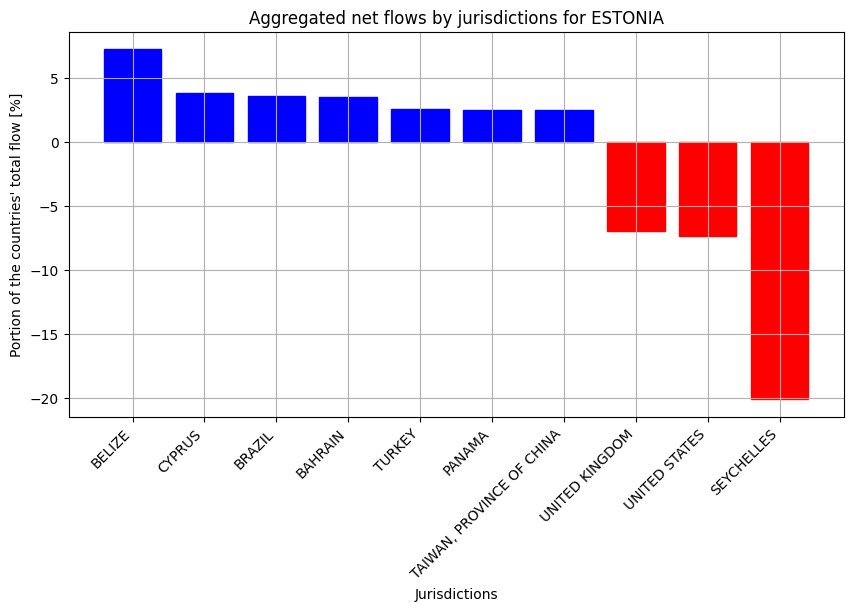

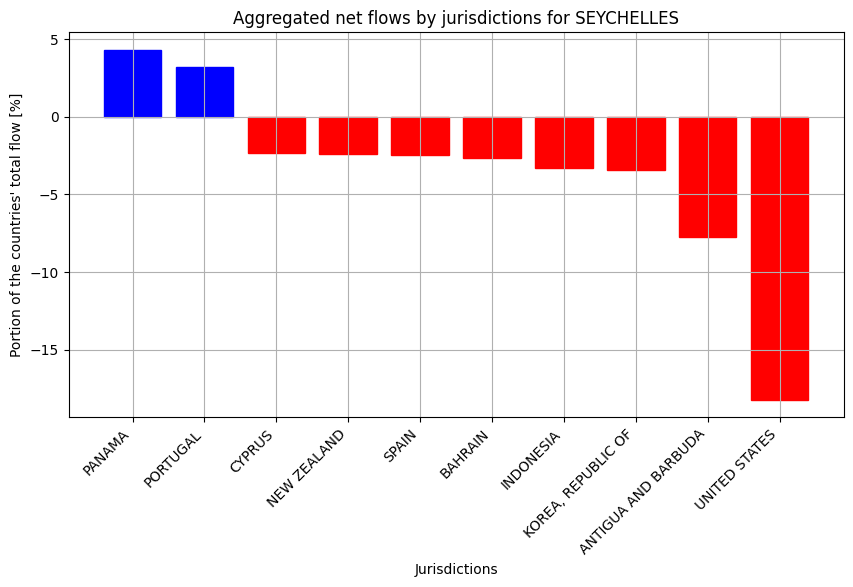

In [31]:
def plot_net_flows_by_country(df,save,country):
    _src_amounts = src_amounts.copy()[src_amounts["jurisdictions"]== country]
    _dst_amounts = dst_amounts.copy()[dst_amounts["jurisdictions"]== country]
    
    df = df[(df['dst_jurisdictions'] == country) | (df['src_jurisdictions'] == country)]

    _dst_amounts = df.groupby(['year', 'dst_jurisdictions'])[['value_USD',"src_jurisdictions"]].sum().reset_index()
    _dst_amounts = _dst_amounts[_dst_amounts["dst_jurisdictions"]!= country]
    _dst_amounts = _dst_amounts.rename(columns={"dst_jurisdictions":"jurisdictions"})
    _dst_amounts["jurisdictions_long"] = _dst_amounts["jurisdictions"].apply(lambda x: juri_names_long[x] if x in juri_names_long else x)
   
    _src_amounts = df.groupby(['year', 'src_jurisdictions'])[['value_USD',"dst_jurisdictions"]].sum().reset_index()
    _src_amounts = _src_amounts[_src_amounts["src_jurisdictions"]!= country]
    _src_amounts = _src_amounts.rename(columns={"src_jurisdictions":"jurisdictions"})
    _src_amounts["jurisdictions_long"] = _src_amounts["jurisdictions"].apply(lambda x: juri_names_long[x] if x in juri_names_long else x)
   

    res = _dst_amounts
    res["value_USD"] = _src_amounts['value_USD'].sub(_dst_amounts['value_USD'], axis=0)
    res = res.groupby(['jurisdictions_long'])['value_USD'].sum().reset_index()

    res = res.sort_values("jurisdictions_long",ascending=True)
    res["value_USD"] =  (res["value_USD"] / res["value_USD"].abs().sum())*100 #convert to %

    #filter out the topx
    cutoff = 10
    top_cutoff = float(res["value_USD"].abs().nlargest(cutoff).nsmallest(1).iloc[0])#
    res = res[res["value_USD"].abs()>=top_cutoff]
 
    res = res.sort_values(by='value_USD',ascending=False)
    plt.figure(figsize=(10, 5))

    # Plot the bar chart
    bars = plt.bar(res['jurisdictions_long'], res['value_USD'])

    # Set labels and title
    plt.xlabel('Jurisdictions')
    plt.ylabel("Portion of the countries' total flow [%]")


    plt.title('Aggregated net flows by jurisdictions for '+juri_names_long[country])

    # Rotate x-axis labels for better visibility
    plt.xticks(rotation=45,ha='right')
    plt.grid(True)

    # Color the bars based on a condition
    for bar, value in zip(bars, res['value_USD']):
        if value < 0:
            bar.set_color('red')
        else:
            bar.set_color('blue')

    # Display the plot
    if(save):
            plt.savefig("figs/aggregated_"+country,bbox_inches='tight')
    else:  
        plt.show()


for country in ["AT","US","EE","SC"]:
    plot_net_flows_by_country(expanded_df,country=country,save=True)


## Aggregated net flows by jurisdictions (HEATMAP)

interactive(children=(IntSlider(value=2017, description='year', max=2022, min=2012), Output()), _dom_classes=(…

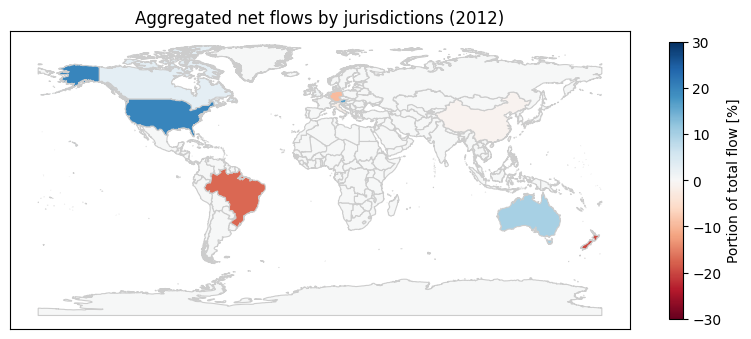

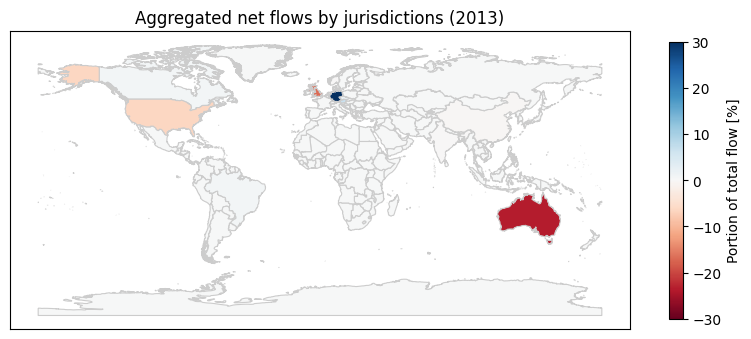

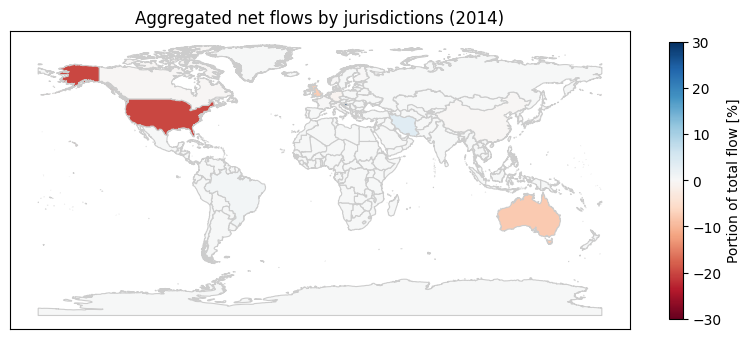

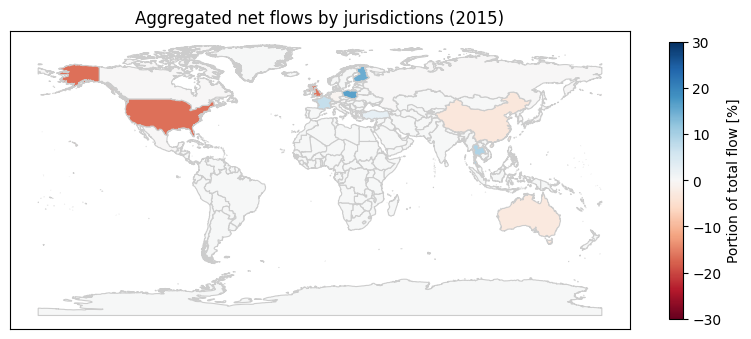

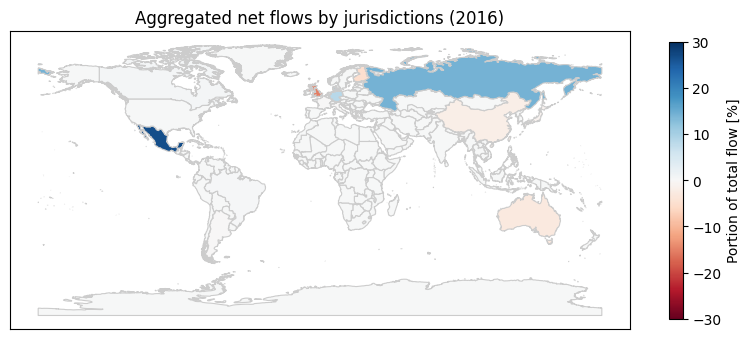

...

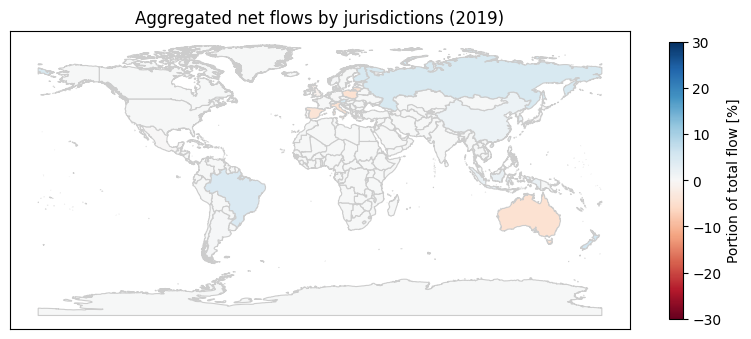

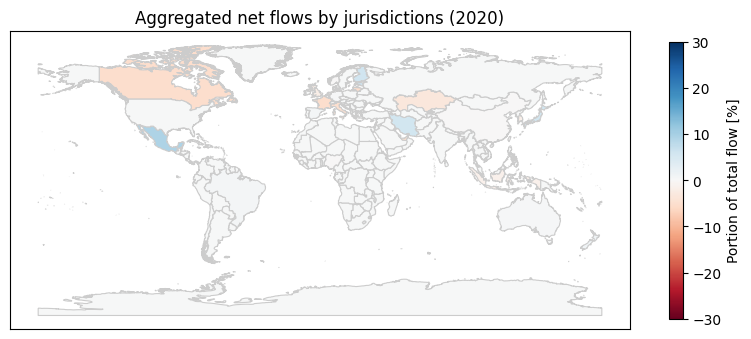

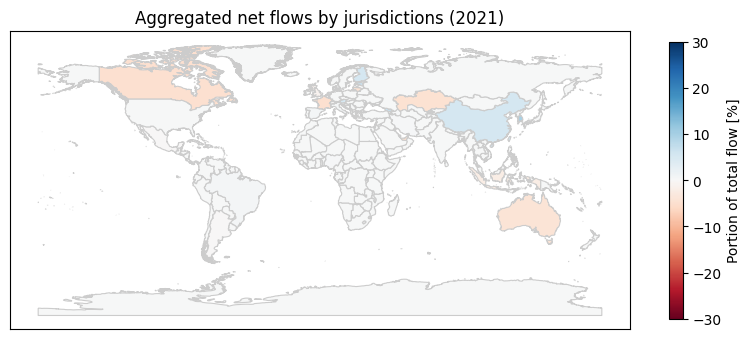

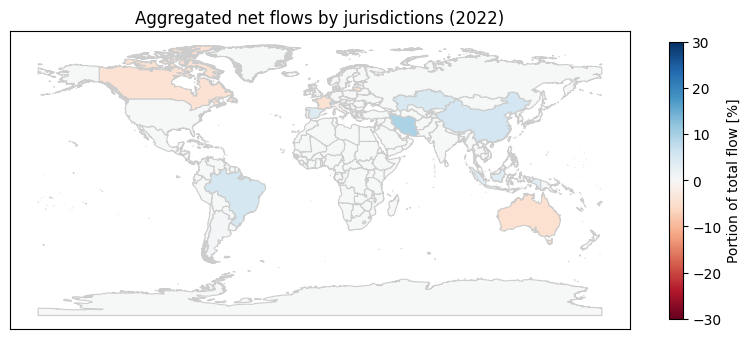

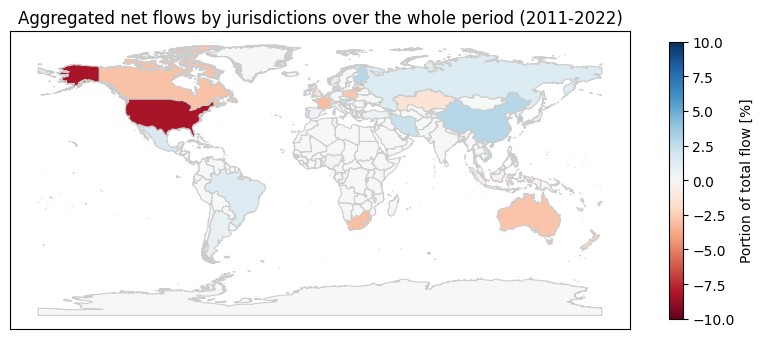

In [32]:
def plot_net_flows_by_year_heatmap(src_amounts,dst_amounts,year,save,forall):
    if not forall:
        _src_amounts = src_amounts.copy()[src_amounts["year"]== year]
        _dst_amounts = dst_amounts.copy()[dst_amounts["year"]== year]
    else:
        _src_amounts = src_amounts.copy()
        _dst_amounts = dst_amounts.copy()

    res = _dst_amounts
    res["value_USD"] = _src_amounts['value_USD'].sub(_dst_amounts['value_USD'], axis=0)
    res = res.groupby(['jurisdictions'])['value_USD'].sum().reset_index()

    res = res.sort_values("jurisdictions",ascending=True)
    res["value_USD"] =  (res["value_USD"] / res["value_USD"].abs().sum())*100 #convert to %

    res.rename(columns={'jurisdictions':'alpha-2'},inplace=True)
    country_codes = pd.read_csv('data/country_codes.csv')
    country_codes = country_codes[['alpha-2','alpha-3']]

    c_merged_df= pd.merge(res, country_codes,on='alpha-2',how='left')
    c_merged_df = c_merged_df.fillna(0)
    c_merged_df.rename(columns={'alpha-2':'ISO'},inplace=True)
    map_data = gpd.read_file('shapefile/World_Countries__Generalized_.shp')
    c_merged_data = map_data.merge(c_merged_df, on='ISO',how='left')
    c_merged_data = c_merged_data.fillna(0)

    # normalize color
    if forall:
        vmin, vmax, vcenter = -10, 10, 0
        norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    else:
        vmin, vmax, vcenter = -30, 30, 0
        norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    # create a normalized colorbar
    cmap = 'RdBu'
    cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    
    fig, ax = plt.subplots(figsize=(10, 8))

    c_merged_data.plot(column='value_USD', cmap=cmap, linewidth=0.8, ax=ax, edgecolor='0.8', legend=False,norm=norm)
    fig.colorbar(cbar,ax=ax,shrink=0.45,label="Portion of total flow [%]")

    plt.xticks([])
    plt.yticks([])
    if forall:
        plt.title('Aggregated net flows by jurisdictions over the whole period (2011-2022)')
    else:
        plt.title('Aggregated net flows by jurisdictions ('+str(year)+')')

    # Display the plot
    if(save):
        if forall:
            plt.savefig("figs/heatmap",bbox_inches='tight')
        else:
            plt.savefig("figs/heatmap_"+str(year),bbox_inches='tight')
    else:  
        plt.show()
    plt.show()

interact(plot_net_flows_by_year_heatmap,src_amounts=fixed(src_amounts),dst_amounts=fixed(dst_amounts),year=(2012,2022,1),save=fixed(False),forall=fixed(False))

for year in range(2012,2023,1):
    plot_net_flows_by_year_heatmap(src_amounts=src_amounts,dst_amounts=dst_amounts,year=year,save=True,forall=False)

plot_net_flows_by_year_heatmap(src_amounts=src_amounts,dst_amounts=dst_amounts,year=year,save=True,forall=True)

# Are crypto asset transfers done to neighbouring countries (same region) or international? 

## Locality on a heatmap

interactive(children=(IntSlider(value=2017, description='year', max=2022, min=2012), Output()), _dom_classes=(…

/tmp/ipykernel_8317/3047087198.py:46: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



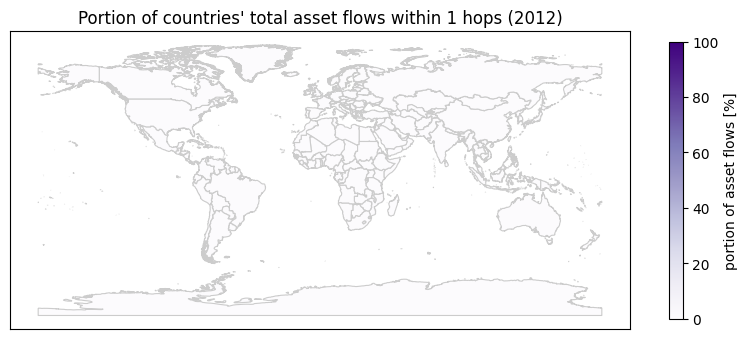

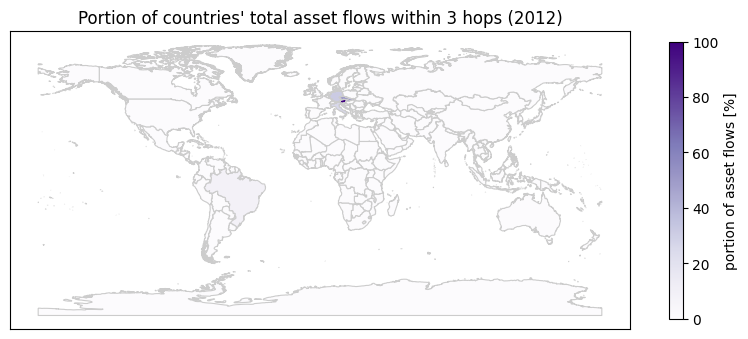

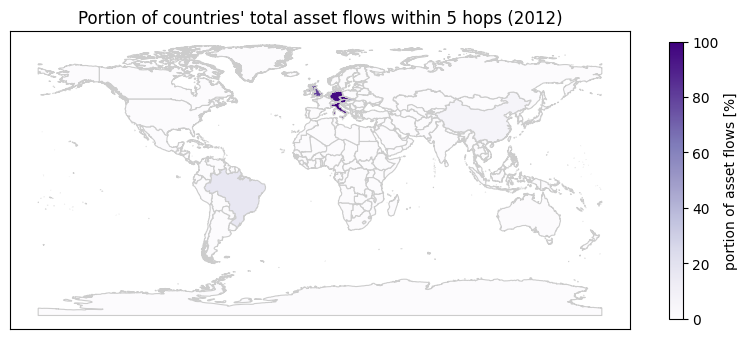

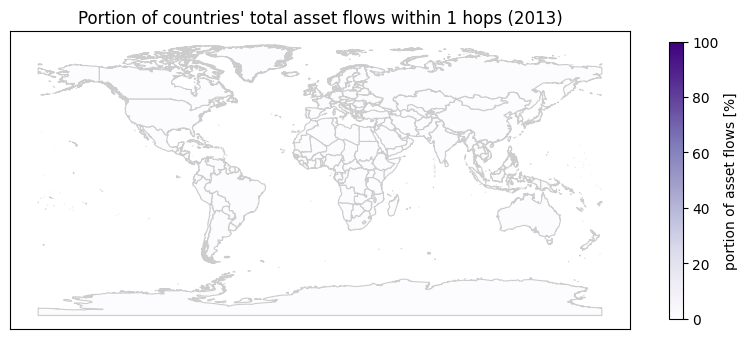

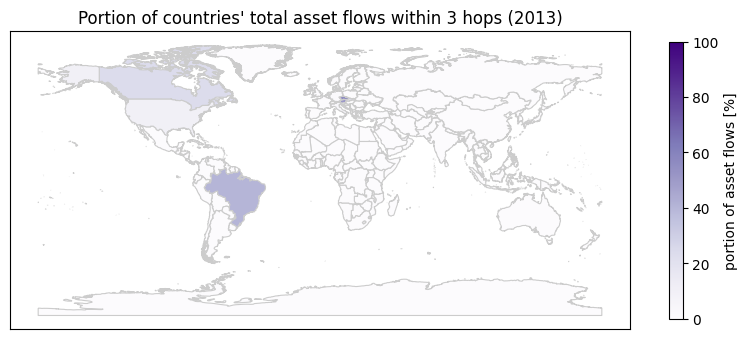

...

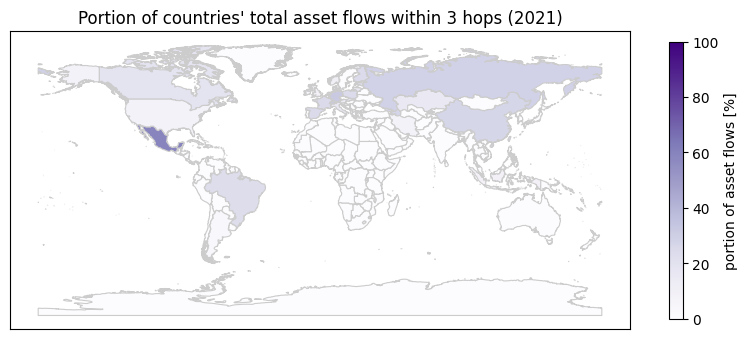

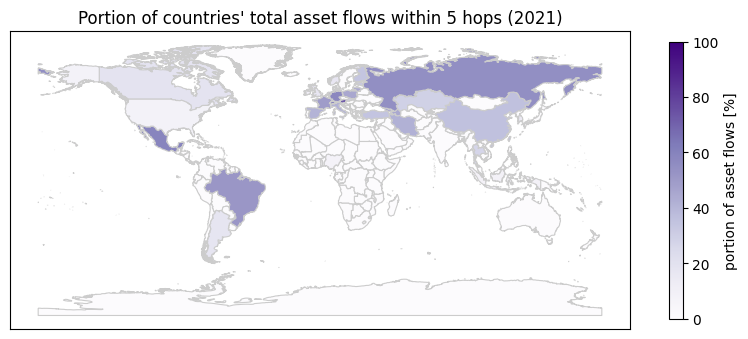

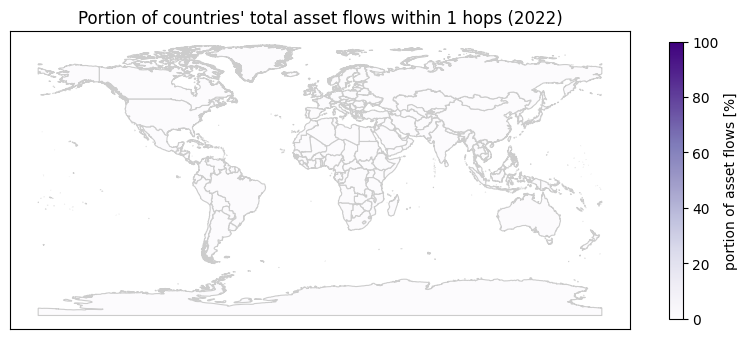

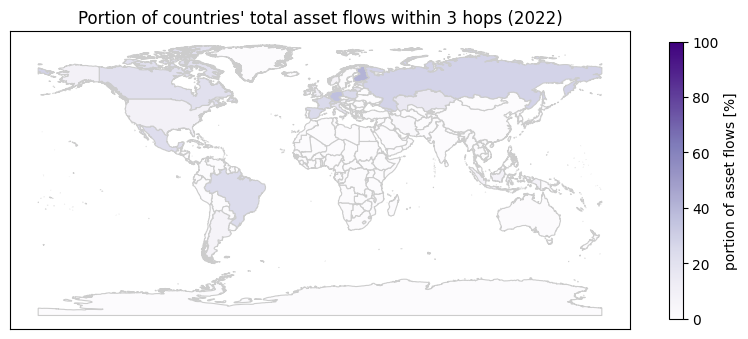

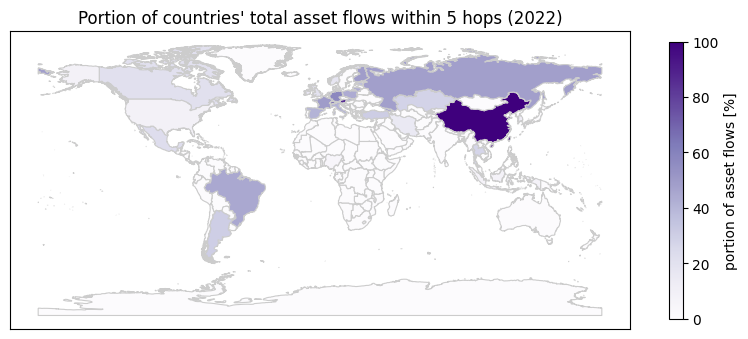

In [33]:
neighbours = pd.read_csv('data/neighbour_distance_matrix.csv', index_col=0, delimiter=';', na_values='NAN')
pd.options.mode.chained_assignment = None  # default='warn'
pd.set_option('display.max_rows', None)

locality_df = expanded_df_without_inland.copy() 
#locality_df = expanded_df_with_inland.copy()

locality_df["value_BTC"] = locality_df["value_USD"] / locality_df["high"]
locality_df = locality_df[locality_df['dst_jurisdictions'] != ""]
locality_df = locality_df[locality_df['src_jurisdictions'] != ""]

locality_df = locality_df.drop(['src_id','dst_id','src_uri','dst_uri','src_label','dst_label','src_categories','dst_categories','date','high'],axis=1)
locality_df = locality_df.groupby(['year', 'src_jurisdictions','dst_jurisdictions'])[['value_USD', 'value_asset', 'value_BTC']].sum().reset_index()
locality_df['src_jurisdictions_long'] = locality_df['src_jurisdictions'].apply(lambda x: juri_names_long[x] if x in juri_names_long else "NOT FOUND")
locality_df['dst_jurisdictions_long'] = locality_df['dst_jurisdictions'].apply(lambda x: juri_names_long[x] if x in juri_names_long else "NOT FOUND")
locality_df = locality_df[(locality_df['src_jurisdictions_long'] != 'GIBRALTAR') & (locality_df['src_jurisdictions_long'] != 'CAYMAN ISLANDS') & (locality_df['src_jurisdictions_long'] != 'HONG KONG') & (locality_df['src_jurisdictions_long'] != 'TAIWAN, PROVINCE OF CHINA') & (locality_df['src_jurisdictions_long'] != 'VIRGIN ISLANDS, BRITISH')]
locality_df = locality_df[(locality_df['dst_jurisdictions_long'] != 'GIBRALTAR') & (locality_df['dst_jurisdictions_long'] != 'CAYMAN ISLANDS') & (locality_df['dst_jurisdictions_long'] != 'HONG KONG') & (locality_df['dst_jurisdictions_long'] != 'TAIWAN, PROVINCE OF CHINA') & (locality_df['dst_jurisdictions_long'] != 'VIRGIN ISLANDS, BRITISH')]

def plot_locality(data, neighbours, year, jumps_arr, save):
    for jumps in jumps_arr:
        data = data[data['year'] == year]
        data['jumps'] = data.apply(lambda row: neighbours[row['src_jurisdictions_long']][row['dst_jurisdictions_long']],axis=1)
        data = data.dropna(subset=['jumps'])
        data_filtered = data.copy()
        data_filtered['value_USD'] = data_filtered.apply(lambda row: 0 if row['jumps'] >= jumps else row['value_USD'],axis=1)

        data_keyed = data.groupby(['src_jurisdictions'])[['value_USD']].sum().reset_index()
        data_filtered_keyed = data_filtered.groupby(['src_jurisdictions'])[['value_USD']].sum().reset_index()
        data_keyed['value_USD_without'] = data_filtered_keyed["value_USD"]
        data_keyed['factor'] = (data_keyed['value_USD_without'] / data_keyed['value_USD'])*100

        data_keyed.rename(columns={'src_jurisdictions':'ISO'},inplace=True)

        map_data = gpd.read_file('shapefile/World_Countries__Generalized_.shp')
        merged_data = map_data.merge(data_keyed, on='ISO',how='left')
        merged_data = merged_data.fillna(0)

        # normalize color
        vmin, vmax, vcenter = 0, 100, 50
        norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    
        # create a normalized colorbar
        cmap = 'Purples'
        cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    
        fig, ax = plt.subplots(figsize=(10, 8))

        merged_data.plot(column='factor', cmap=cmap, linewidth=0.8, ax=ax, edgecolor='0.8', legend=False,norm=norm)
        fig.colorbar(cbar,ax=ax,shrink=0.45,label="portion of asset flows [%]")

        plt.xticks([])
        plt.yticks([])
        plt.title('Portion of countries\' total asset flows within ' + str(jumps) + ' hops ('+str(year)+')')

        # Display the plot
        if(save):
            plt.savefig("figs/locality_"+str(year)+"_"+str(jumps)+"jumps",bbox_inches='tight')
        else:
            plt.show()
    
jumps_arr = [1, 3, 5]
interact(plot_locality,data=fixed(locality_df),neighbours=fixed(neighbours),year=(2012,2022,1),jumps_arr=fixed(jumps_arr), save=fixed(False))

for y in range(2012,2023,1):
    plot_locality(locality_df,neighbours,y,jumps_arr=[1, 3, 5],save=True)


# Correlation of crypto-asset values with countries’ GDP / Inhabitants / “Tax Havens” / “Country Perceived Corruption Index”

In [34]:
# Prepare Population
population_country = pd.merge(population, country_codes, left_on='Country Code', right_on='alpha-3', how='inner')

## Population vs Recieved Value

PearsonRResult(statistic=-0.0464286917281993, pvalue=0.7200938955777578)

SignificanceResult(statistic=0.11481024467457202, pvalue=0.374238359931199)

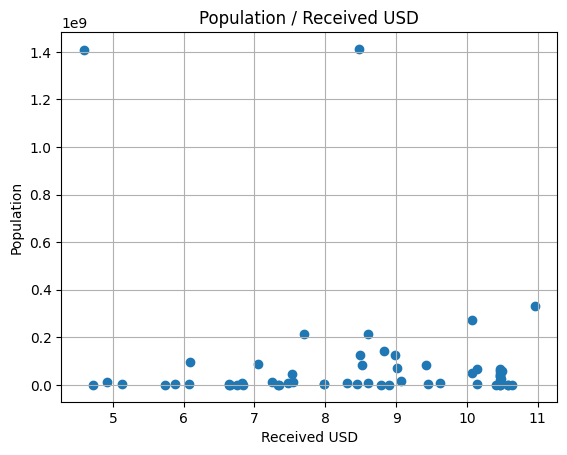

In [35]:
flow_data = expanded_df.copy()
dst_juri_sum = expanded_df.groupby('dst_jurisdictions')['value_USD'].sum()
population_gdp = pd.merge(dst_juri_sum, population_country, left_on='dst_jurisdictions', right_on='alpha-2', how='inner')

fig, ax = plt.subplots()
scatter = ax.scatter(x=np.log10(population_gdp.value_USD), y=population_gdp['2021'])
plt.xlabel('Received USD')
plt.ylabel('Population')
plt.title('Population / Received USD')
plt.grid(True)

corr = pearsonr(population_gdp.value_USD, population_gdp['2021'])
display(corr)
corr = spearmanr(population_gdp.value_USD, population_gdp['2021'])
display(corr)


## TAX HAVEN VS RECIEVED

In [36]:
# Prepare tax haven data
cthi_country = pd.merge(cthi, country_codes, left_on='Country', right_on='name', how='inner')

PearsonRResult(statistic=0.08047321034712297, pvalue=0.672493952790164)

SignificanceResult(statistic=0.2382912463293584, pvalue=0.2047704212205612)

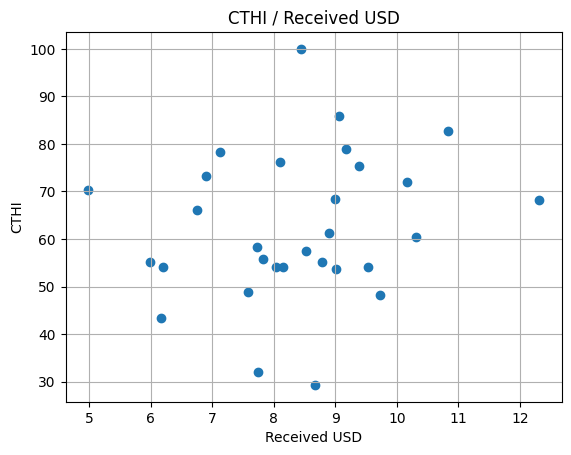

In [37]:
# CTHI (Tax Haven Score)
# TODO UNITS ON AXED also maybe scale to BN USD? 
flow_data = merged_df.copy()
dst_juri_sum = merged_df.groupby('dst_jurisdictions')['value_USD'].sum()
receivers_cthi = pd.merge(dst_juri_sum, cthi_country, left_on='dst_jurisdictions', right_on='alpha-2', how='inner')

fig, ax = plt.subplots()
scatter = ax.scatter(x=np.log10(receivers_cthi.value_USD), y=receivers_cthi['Haven Score'])
plt.xlabel('Received USD')
plt.ylabel('CTHI')
plt.title('CTHI / Received USD')
plt.grid(True)
corr = pearsonr(receivers_cthi.value_USD, receivers_cthi['Haven Score'])
display(corr)

corr = spearmanr(receivers_cthi.value_USD, receivers_cthi['Haven Score'])
display(corr)


## TAX HAVEN VS SENT
TODO

## CORRUPTION VS RECIEVED

In [38]:
# Prepare CPI
cpi_country = pd.merge(cpi, country_codes, left_on='Country', right_on='name', how='inner')

PearsonRResult(statistic=-0.01847831702116976, pvalue=0.7050593545240259)

SignificanceResult(statistic=-0.05337228953387079, pvalue=0.2739833050480826)

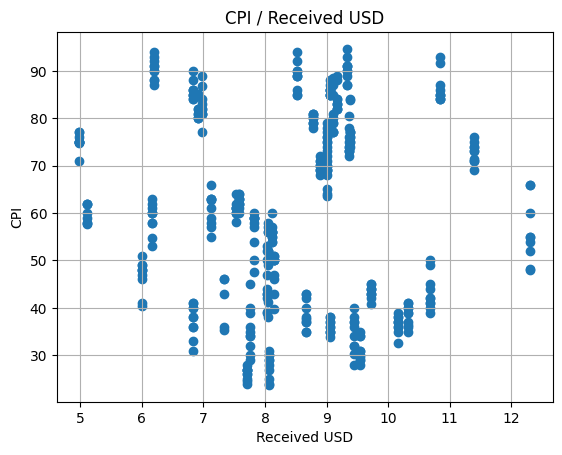

In [39]:
# TODO UNITS ON AXED also maybe scale to BN USD? 
flow_data = merged_df.copy()
dst_juri_sum = merged_df.groupby('dst_jurisdictions')['value_USD'].sum()
receivers_cpi = pd.merge(dst_juri_sum, cpi_country, left_on='dst_jurisdictions', right_on='alpha-2', how='inner')

fig, ax = plt.subplots()
scatter = ax.scatter(x=np.log10(receivers_cpi.value_USD), y=receivers_cpi['CPI Score'])
plt.xlabel('Received USD')
plt.ylabel('CPI')
plt.title('CPI / Received USD')
plt.grid(True)

corr = pearsonr(receivers_cpi.value_USD, receivers_cpi['CPI Score'])
display(corr)
corr = spearmanr(receivers_cpi.value_USD, receivers_cpi['CPI Score'])
display(corr)

## CORRUPTION VS SENT
TODO

## GDP VS RECIEVED

In [40]:
# Prepare GDP
gdp_country = pd.merge(gdp, country_codes, left_on='Country Code', right_on='alpha-3', how='inner')

PearsonRResult(statistic=0.2557933655282668, pvalue=0.06191579929940489)

SignificanceResult(statistic=0.31732418524871353, pvalue=0.01938377190284382)

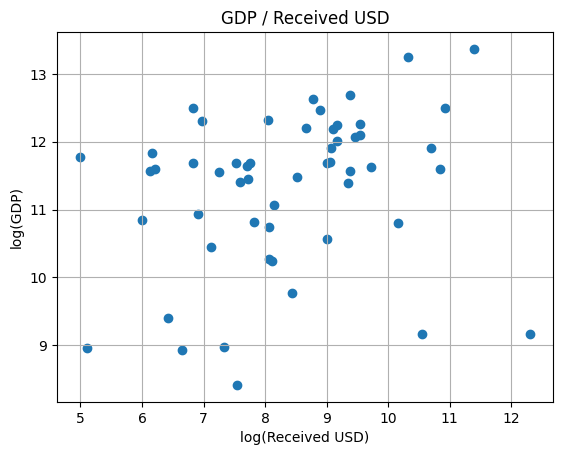

In [41]:
flow_data = merged_df.copy()
dst_juri_sum = merged_df.groupby('dst_jurisdictions')['value_USD'].sum()
receivers_gdp = pd.merge(dst_juri_sum, gdp_country, left_on='dst_jurisdictions', right_on='alpha-2', how='inner')
receivers_gdp = receivers_gdp.dropna(subset=['2021'])

fig, ax = plt.subplots()
scatter = ax.scatter(x=np.log10(receivers_gdp.value_USD), y=np.log10(receivers_gdp['2021']))
plt.xlabel('log(Received USD)')
plt.ylabel('log(GDP)')
plt.title('GDP / Received USD')
plt.grid(True)

corr = pearsonr(np.log10(receivers_gdp.value_USD), np.log10(receivers_gdp['2021']))
display(corr)
corr = spearmanr(receivers_gdp.value_USD, receivers_gdp['2021'])
display(corr)

## GDP VS Sent

PearsonRResult(statistic=0.253412205297368, pvalue=0.06711700431573812)

SignificanceResult(statistic=0.29608127721335264, pvalue=0.03134797376685942)

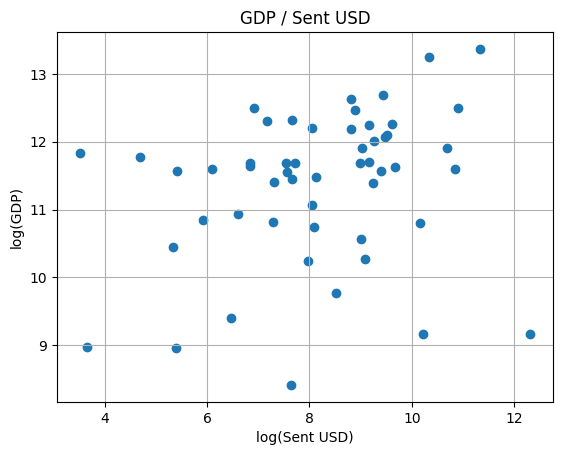

In [42]:
# TODO: why to we have one negative outlier?
flow_data = merged_df.copy()
src_juri_sum = merged_df.groupby('src_jurisdictions')['value_USD'].sum()
receivers_gdp = pd.merge(src_juri_sum, gdp_country, left_on='src_jurisdictions', right_on='alpha-2', how='inner')
receivers_gdp = receivers_gdp.dropna(subset=['2021'])

fig, ax = plt.subplots()
scatter = ax.scatter(x=np.log10(receivers_gdp.value_USD), y=np.log10(receivers_gdp['2021']))
plt.xlabel('log(Sent USD)')
plt.ylabel('log(GDP)')
plt.title('GDP / Sent USD')
plt.grid(True)

corr = pearsonr(np.log10(receivers_gdp.value_USD), np.log10(receivers_gdp['2021']))
display(corr)
corr = spearmanr(receivers_gdp.value_USD, receivers_gdp['2021'])
display(corr)